<a href="https://colab.research.google.com/github/saiteja-ms/DAL-Project/blob/main/Assignment_9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/csv-file/train.csv
/kaggle/input/image-dataset/category_attributes.parquet
/kaggle/input/image-dataset/train.csv
/kaggle/input/image-dataset/train_images/059339.jpg
/kaggle/input/image-dataset/train_images/032501.jpg
/kaggle/input/image-dataset/train_images/046754.jpg
/kaggle/input/image-dataset/train_images/039337.jpg
/kaggle/input/image-dataset/train_images/042195.jpg
/kaggle/input/image-dataset/train_images/011035.jpg
/kaggle/input/image-dataset/train_images/040257.jpg
/kaggle/input/image-dataset/train_images/054361.jpg
/kaggle/input/image-dataset/train_images/031167.jpg
/kaggle/input/image-dataset/train_images/042233.jpg
/kaggle/input/image-dataset/train_images/049288.jpg
/kaggle/input/image-dataset/train_images/058266.jpg
/kaggle/input/image-dataset/train_images/010011.jpg
/kaggle/input/image-dataset/train_images/031392.jpg
/kaggle/input/image-dataset/train_images/015658.jpg
/kaggle/input/image-dataset/train_images/056905.jpg
/kaggle/input/image-dataset/train_images/

# Task 1
Generating 10 baskets, one basket eah for (category, attribute) tuple pair.

In [ ]:
df = pd.read_csv("/kaggle/input/csv-file/train.csv")
df.head()

,id,Category,len,attr_1,attr_2,attr_3,attr_4,attr_5,attr_6,attr_7,attr_8,attr_9,attr_10
0,0,Men Tshirts,5,default,round,printed,default,short sleeves,NaN,NaN,NaN,NaN,NaN
1,1,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
2,2,Men Tshirts,5,default,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
3,3,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
4,4,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN


In [ ]:
attribute_cols = [col for col in df.columns if 'attr_' in col]

In [ ]:
attribute_cols

['attr_1',
 'attr_2',
 'attr_3',
 'attr_4',
 'attr_5',
 'attr_6',
 'attr_7',
 'attr_8',
 'attr_9',
 'attr_10']

In [ ]:
# Dictionary to store unique attributes for each category
category_attributes = {}

In [ ]:
# Group by 'Category' and extract unique attributes
for category, group in df.groupby('Category'):
    unique_attrs = {col: group[col].dropna().unique().tolist() for col in attribute_cols}
    category_attributes[category] = unique_attrs

In [ ]:
# Display the attributes for each category
for category, attributes in category_attributes.items():
    print(f"Category: {category}")
    for attr, values in attributes.items():
        print(f"  {attr}: {values}")
    print()

Category: Kurtis
  attr_1: ['black', 'red', 'navy blue', 'maroon', 'green', 'pink', 'blue', 'purple', 'grey', 'yellow', 'white', 'multicolor', 'orange']
  attr_2: ['straight', 'a-line']
  attr_3: ['knee length', 'calf length']
  attr_4: ['daily', 'party']
  attr_5: ['net', 'default']
  attr_6: ['solid', 'default']
  attr_7: ['solid', 'default']
  attr_8: ['three-quarter sleeves', 'short sleeves', 'sleeveless']
  attr_9: ['regular', 'sleeveless']
  attr_10: []

Category: Men Tshirts
  attr_1: ['default', 'multicolor', 'black', 'white']
  attr_2: ['round', 'polo']
  attr_3: ['printed', 'solid']
  attr_4: ['default', 'solid', 'typography']
  attr_5: ['short sleeves', 'long sleeves']
  attr_6: []
  attr_7: []
  attr_8: []
  attr_9: []
  attr_10: []

Category: Sarees
  attr_1: ['same as saree', 'solid', 'same as border', 'default']
  attr_2: ['woven design', 'zari', 'no border', 'solid', 'default', 'temple border']
  attr_3: ['small border', 'big border', 'no border']
  attr_4: ['multicolor

In [ ]:
# Dictionary to store combined attributes for each category
category_combined_attributes = {}

# Group by 'Category' and collect all unique attributes across attr_1 to attr_10
for category, group in df.groupby('Category'):
    combined_attrs = set()  # Using a set to ensure uniqueness
    for col in attribute_cols:
        combined_attrs.update(group[col].dropna().unique())  # Add unique values from each attribute column
    category_combined_attributes[category] = list(combined_attrs)  # Convert set to list

# Display the combined attributes for each category
for category, attributes in category_combined_attributes.items():
    print(f"{category}: {attributes}\n")

Kurtis: ['three-quarter sleeves', 'green', 'red', 'navy blue', 'pink', 'yellow', 'sleeveless', 'multicolor', 'short sleeves', 'calf length', 'black', 'default', 'solid', 'straight', 'orange', 'grey', 'regular', 'daily', 'party', 'white', 'a-line', 'net', 'knee length', 'maroon', 'purple', 'blue']

Men Tshirts: ['round', 'solid', 'typography', 'multicolor', 'short sleeves', 'long sleeves', 'black', 'printed', 'default', 'white', 'polo']

Sarees: ['green', 'navy blue', 'same as border', 'pink', 'zari', 'yellow', 'multicolor', 'applique', 'ethnic motif', 'default', 'same as saree', 'wedding', 'no border', 'cream', 'tassels and latkans', 'no', 'solid', 'checked', 'yes', 'peacock', 'small border', 'party', 'traditional', 'daily', 'elephant', 'temple border', 'printed', 'white', 'zari woven', 'floral', 'jacquard', 'botanical', 'big border', 'woven design']

Women Tops & Tunics: ['tie-ups', 'typography', 'three-quarter sleeves', 'stylised', 'green', 'navy blue', 'red', 'pink', 'ruffles', 'wai

In [ ]:
# Step 1: Combine attribute columns into a single 'Attributes' column
attr_columns = [col for col in df.columns if 'attr' in col]
df['Attributes'] = df[attr_columns].apply(lambda row: [x for x in row if pd.notna(x)], axis=1)

# Drop the individual attribute columns as they are no longer needed
df_cleaned = df[['id', 'Category', 'Attributes']]

# Display the cleaned DataFrame
print(df_cleaned.head())

# Step 2: Function to find images for a given category-attribute tuple (basket)
def find_images_for_bucket(category, attribute, df):
    """
    This function returns a list of image ids that belong to the specified category-attribute combination.
    """
    matching_ids = df[
        (df['Category'] == category) &
        (df['Attributes'].apply(lambda attrs: attribute in attrs))
    ]['id'].tolist()

    return matching_ids

   id     Category                                         Attributes
0   0  Men Tshirts  [default, round, printed, default, short sleeves]
1   1  Men Tshirts    [multicolor, polo, solid, solid, short sleeves]
2   2  Men Tshirts       [default, polo, solid, solid, short sleeves]
3   3  Men Tshirts    [multicolor, polo, solid, solid, short sleeves]
4   4  Men Tshirts    [multicolor, polo, solid, solid, short sleeves]


In [ ]:
def sample_images_for_bucket(category, attribute, df, sample_size=100):
    """
    Returns a list of exactly 100 image IDs for the specified (category, attribute) pair.
    If fewer than 100 images exist, it returns None.
    """
    # Filter images matching the category and attribute
    matching_ids = df[
        (df['Category'] == category) &
        (df['Attributes'].apply(lambda attrs: attribute in attrs))
    ]['id'].tolist()

    # Check if we have at least 100 matching images
    if len(matching_ids) >= sample_size:
        return matching_ids[:sample_size]  # Return the first 100 matching IDs
    else:
        # Return None to indicate insufficient images
        return None

In [ ]:
buckets = [
    ('Kurtis', 'multicolor'),
    ('Kurtis', 'sleeveless'),
    ('Men Tshirts', 'long sleeves'),
    ('Men Tshirts', 'round'),
    ('Sarees', 'wedding'),
    ('Sarees', 'traditional'),
    ('Women Tops & Tunics', 'party'),
    ('Women Tops & Tunics', 'casual'),
    ('Women Tshirts', 'regular'),
    ('Women Tshirts', 'cuffed sleeves')
]

In [ ]:
import random
# Dictionary to store the sampled image IDs for valid buckets
image_samples = {}
# List to store (category, attribute) pairs with insufficient images
insufficient_pairs = []

# Step 4: Loop through each bucket and collect image IDs
for category, attribute in buckets:
    image_ids = sample_images_for_bucket(category, attribute, df_cleaned)

    if image_ids:
        image_samples[(category, attribute)] = image_ids
        print(f"Sampled 100 images for ({category}, {attribute})")
    else:
        insufficient_pairs.append((category, attribute))
        print(f"Insufficient images for ({category}, {attribute})")

# Step 5: Report insufficient (category, attribute) pairs
if insufficient_pairs:
    print("\nInsufficient Image Pairs:")
    for pair in insufficient_pairs:
        print(f"{pair}")

# Optional: Save valid results to a CSV file for future reference
result_df = pd.DataFrame([
    {'Category': cat, 'Attribute': attr, 'Image_IDs': ids}
    for (cat, attr), ids in image_samples.items()
])
result_df.to_csv("valid_sampled_image_ids.csv", index=False)
print("\nValid sampled image IDs saved to 'valid_sampled_image_ids.csv'")

Sampled 100 images for (Kurtis, multicolor)
Sampled 100 images for (Kurtis, sleeveless)
Sampled 100 images for (Men Tshirts, long sleeves)
Sampled 100 images for (Men Tshirts, round)
Sampled 100 images for (Sarees, wedding)
Sampled 100 images for (Sarees, traditional)
Sampled 100 images for (Women Tops & Tunics, party)
Sampled 100 images for (Women Tops & Tunics, casual)
Sampled 100 images for (Women Tshirts, regular)
Sampled 100 images for (Women Tshirts, cuffed sleeves)

Valid sampled image IDs saved to 'valid_sampled_image_ids.csv'


In [ ]:
df = pd.read_csv('/kaggle/working/valid_sampled_image_ids.csv')
print(df.head())

      Category     Attribute  \
0       Kurtis    multicolor   
1       Kurtis    sleeveless   
2  Men Tshirts  long sleeves   
3  Men Tshirts         round   
4       Sarees       wedding   

                                           Image_IDs  
0  [25882, 25949, 26007, 26084, 26141, 26213, 262...  
1  [25824, 25853, 25855, 25856, 25867, 25869, 259...  
2  [6, 7, 8, 9, 12, 13, 15, 16, 21, 22, 24, 25, 2...  
3  [0, 10, 11, 12, 13, 15, 16, 17, 18, 29, 32, 38...  
4  [7474, 7485, 7490, 7516, 7538, 7544, 7556, 761...  


In [ ]:
import seaborn as sns
from sklearn.manifold import Isomap, TSNE

In [ ]:
import matplotlib.pyplot as plt
sns.set(style='whitegrid')
plt.rcParams["figure.figsize"] = (8, 6)

In [ ]:
# Load the CSV file containing valid image IDs
valid_images_df = pd.read_csv('valid_sampled_image_ids.csv')

# Preview the DataFrame to ensure it's correctly loaded
print(valid_images_df.head())
print(valid_images_df.columns)

      Category     Attribute  \
0       Kurtis    multicolor   
1       Kurtis    sleeveless   
2  Men Tshirts  long sleeves   
3  Men Tshirts         round   
4       Sarees       wedding   

                                           Image_IDs  
0  [25882, 25949, 26007, 26084, 26141, 26213, 262...  
1  [25824, 25853, 25855, 25856, 25867, 25869, 259...  
2  [6, 7, 8, 9, 12, 13, 15, 16, 21, 22, 24, 25, 2...  
3  [0, 10, 11, 12, 13, 15, 16, 17, 18, 29, 32, 38...  
4  [7474, 7485, 7490, 7516, 7538, 7544, 7556, 761...  
Index(['Category', 'Attribute', 'Image_IDs'], dtype='object')


In [ ]:
# Define source and destination directories
source_dir = '/kaggle/input/image-dataset/train_images'  # Path to the train_images subfolder
dest_dir = '/kaggle/working/IMAGE_BASKET/'  # Destination folder to store basket-wise images

# Ensure the destination folder exists
os.makedirs(dest_dir, exist_ok=True)

# Iterate over each row in the DataFrame
for _, row in valid_images_df.iterrows():
    category = row['Category']  # Get the category
    attribute = row['Attribute']  # Get the attribute

    # Split Image_IDs by comma
    image_ids = row['Image_IDs'].split(',')  # Adjusted to split by comma

    # Create a folder for each unique <category, attribute> basket
    basket_folder = os.path.join(dest_dir, f"{category}_{attribute}")
    os.makedirs(basket_folder, exist_ok=True)

    # Process each image ID
    for image_id in image_ids:
        image_id = image_id.strip().zfill(6)  # Ensure image_id is a six-digit string (strip whitespace)
        print(f"Processing image ID: {image_id}")

        # Construct source and destination paths
        src = os.path.join(source_dir, f"{image_id}.jpg")  # Assuming images are in .jpg format
        dst = os.path.join(basket_folder, f"{image_id}.jpg")

        # Copy the image to the corresponding basket folder if it exists
        if os.path.exists(src):
            shutil.copy(src, dst)
            print(f"Copied {src} to {dst}")
        else:
            print(f"Warning: {src} not found.")

Processing image ID: [25882
Processing image ID: 025949
Copied /kaggle/input/image-dataset/train_images/025949.jpg to /kaggle/working/IMAGE_BASKET/Kurtis_multicolor/025949.jpg
Processing image ID: 026007
Copied /kaggle/input/image-dataset/train_images/026007.jpg to /kaggle/working/IMAGE_BASKET/Kurtis_multicolor/026007.jpg
Processing image ID: 026084
Copied /kaggle/input/image-dataset/train_images/026084.jpg to /kaggle/working/IMAGE_BASKET/Kurtis_multicolor/026084.jpg
Processing image ID: 026141
Copied /kaggle/input/image-dataset/train_images/026141.jpg to /kaggle/working/IMAGE_BASKET/Kurtis_multicolor/026141.jpg
Processing image ID: 026213
Copied /kaggle/input/image-dataset/train_images/026213.jpg to /kaggle/working/IMAGE_BASKET/Kurtis_multicolor/026213.jpg
Processing image ID: 026254
Copied /kaggle/input/image-dataset/train_images/026254.jpg to /kaggle/working/IMAGE_BASKET/Kurtis_multicolor/026254.jpg
Processing image ID: 026342
Copied /kaggle/input/image-dataset/train_images/026342.j

In [ ]:
import seaborn as sns
from sklearn.manifold import Isomap, TSNE
from sklearn.preprocessing import StandardScaler

#Task - 2:
Visualising the images in the baskets created using t-SNE and Isomap

Processing Folder: Women Tshirts_cuffed sleeves


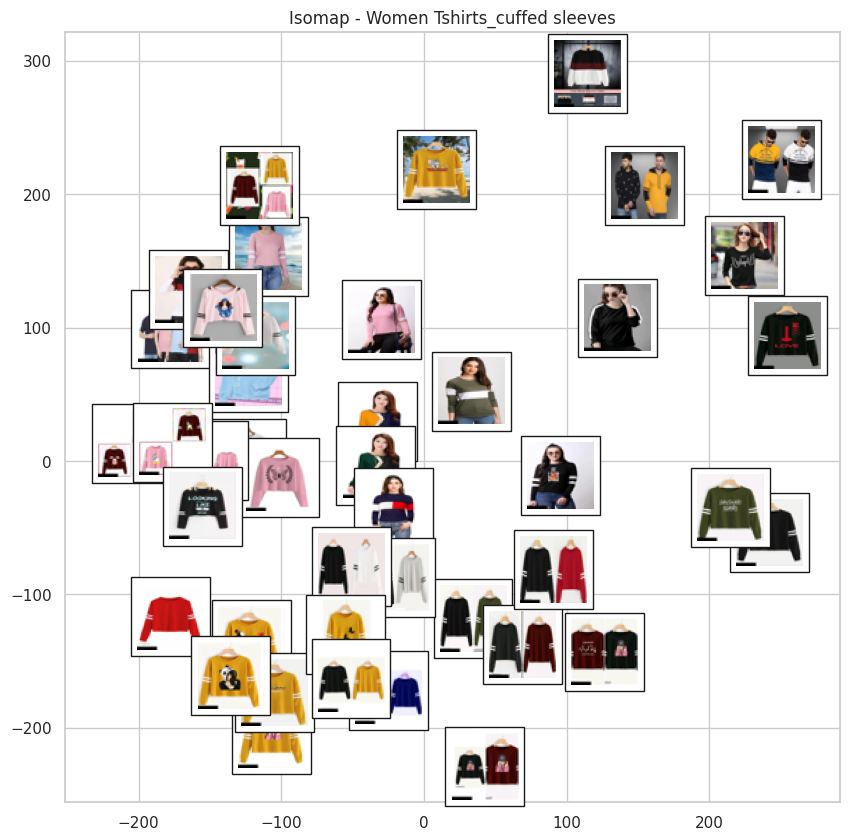

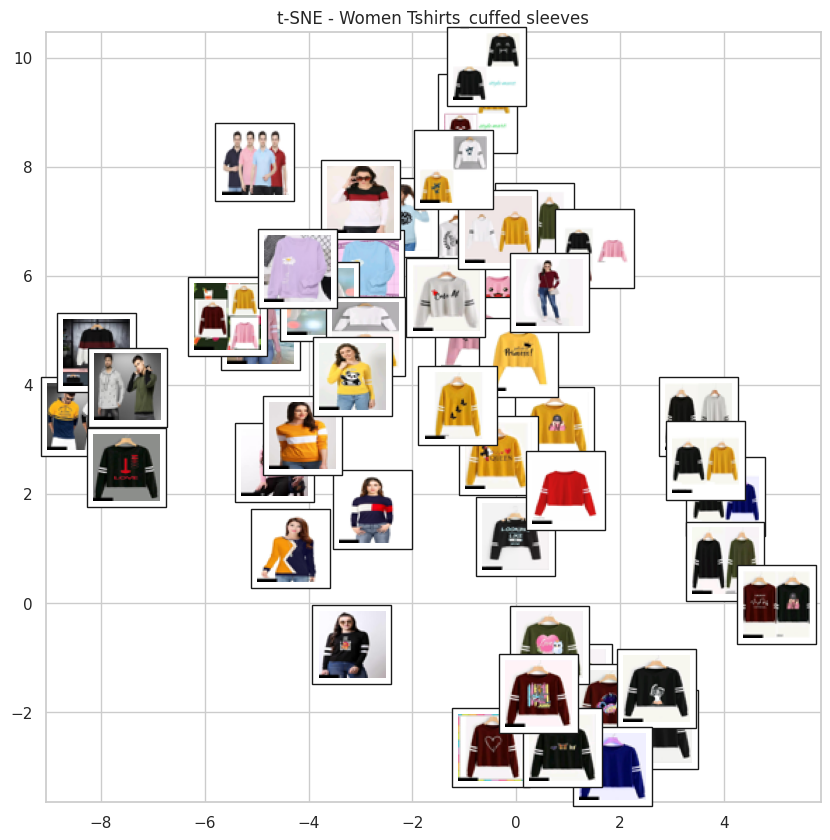

Processing Folder: Women Tops & Tunics_party


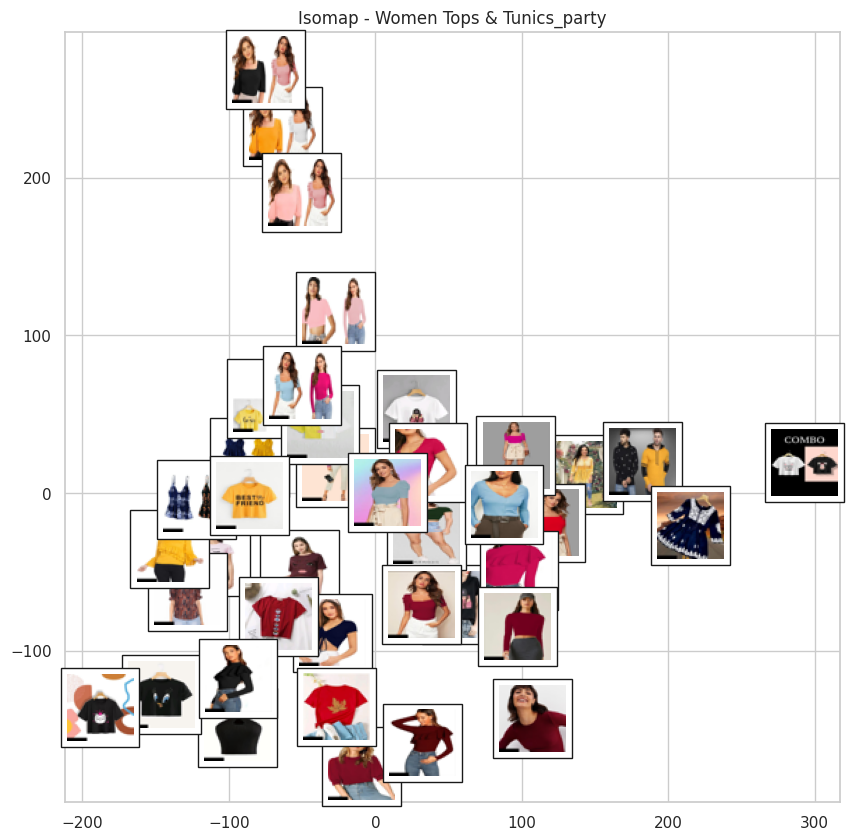

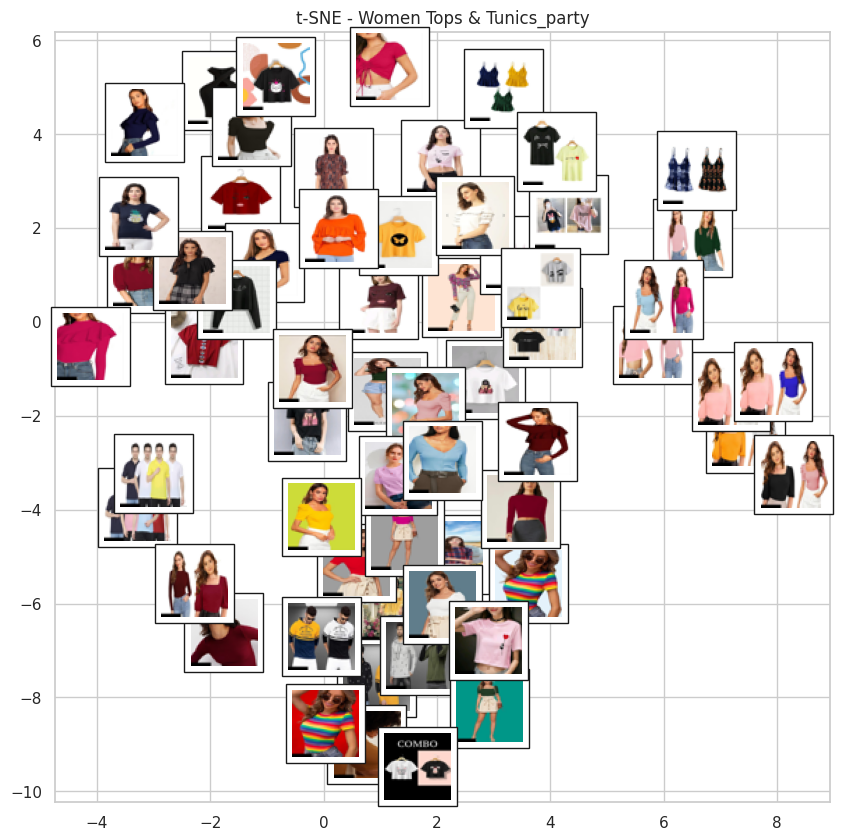

Processing Folder: Sarees_traditional


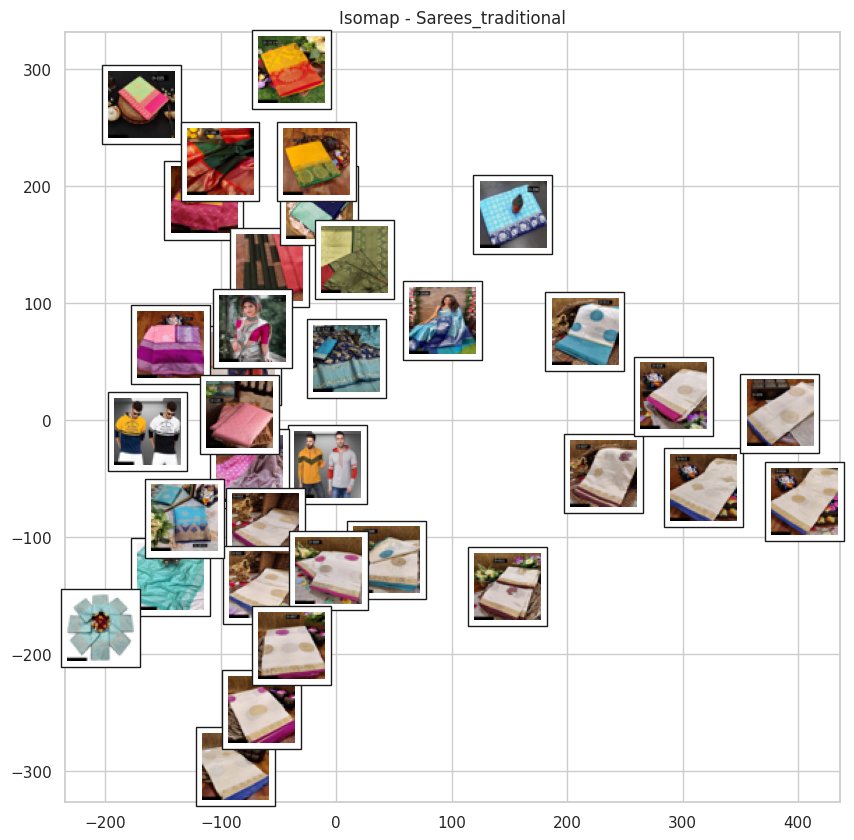

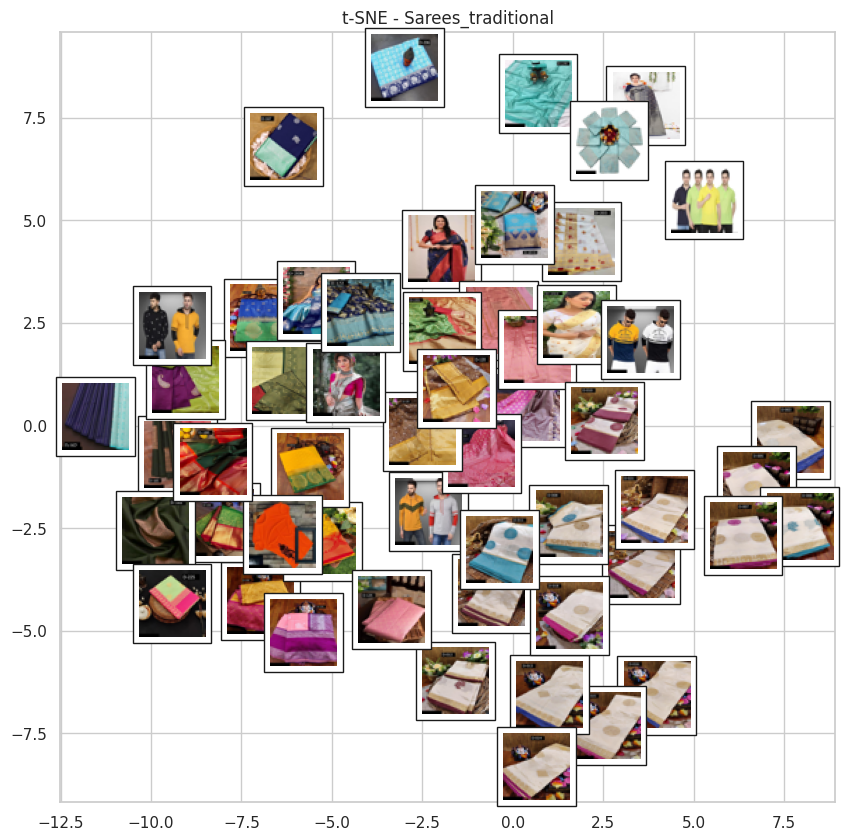

Processing Folder: Sarees_wedding


/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:373: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])


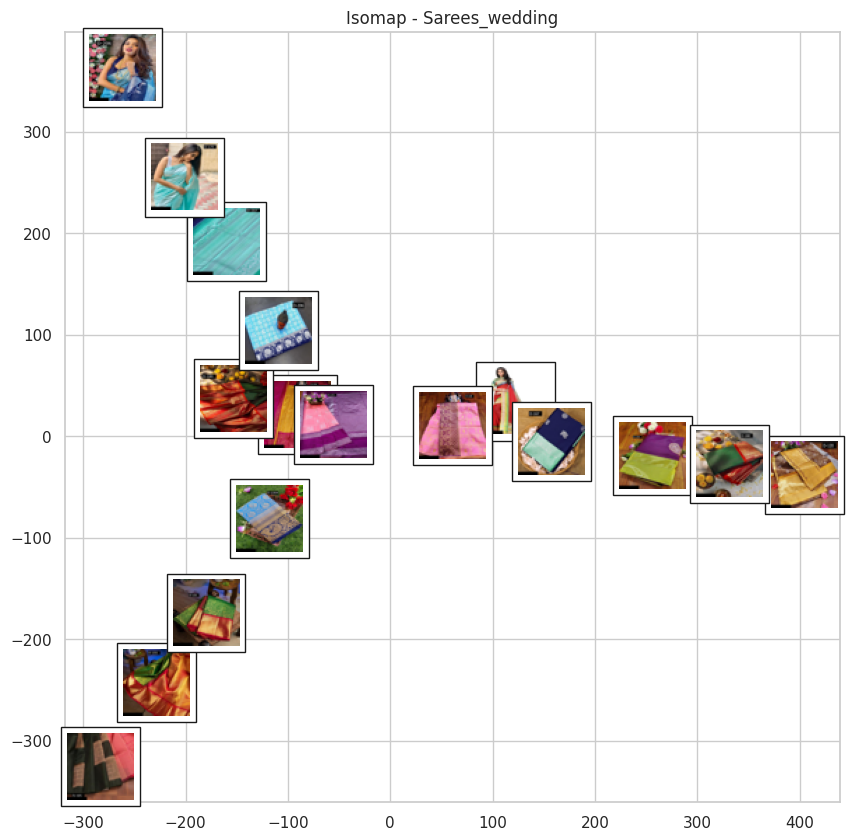

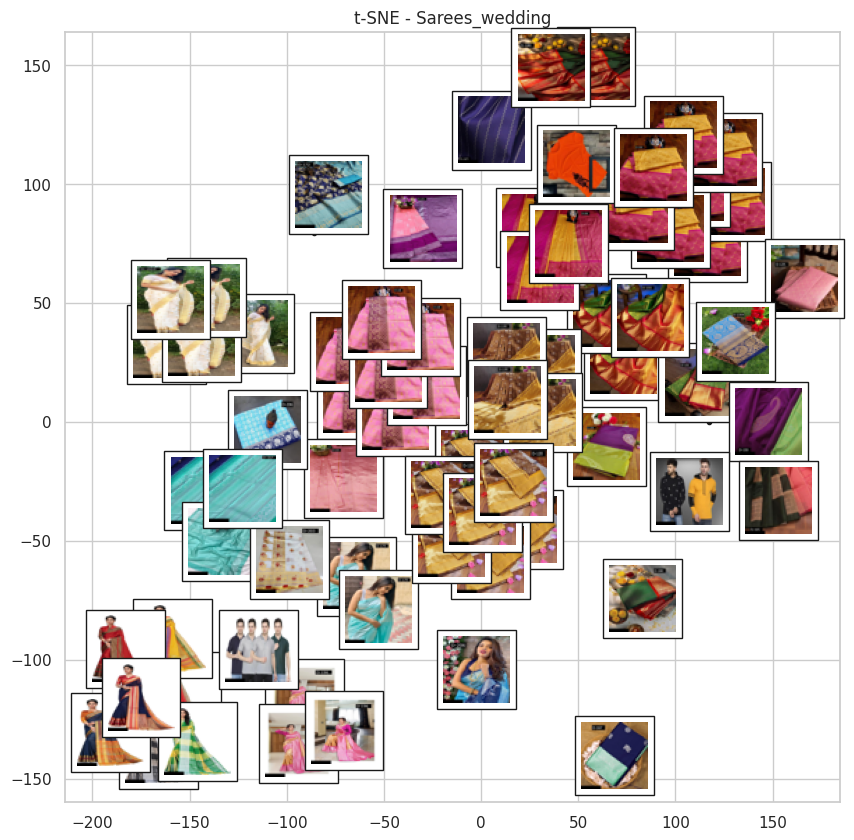

Processing Folder: Men Tshirts_round


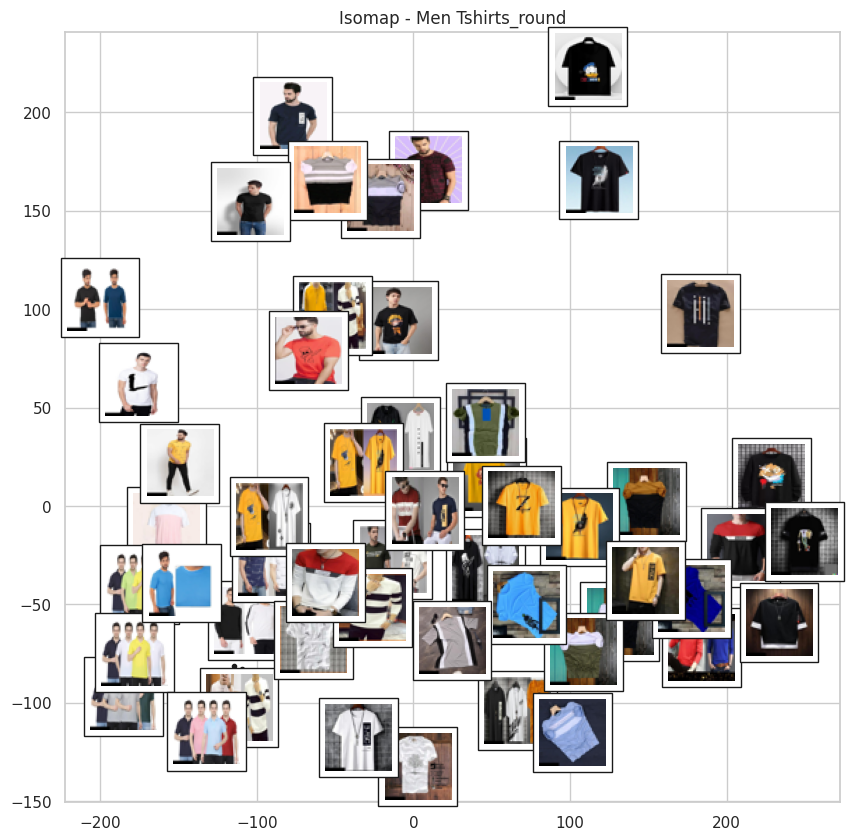

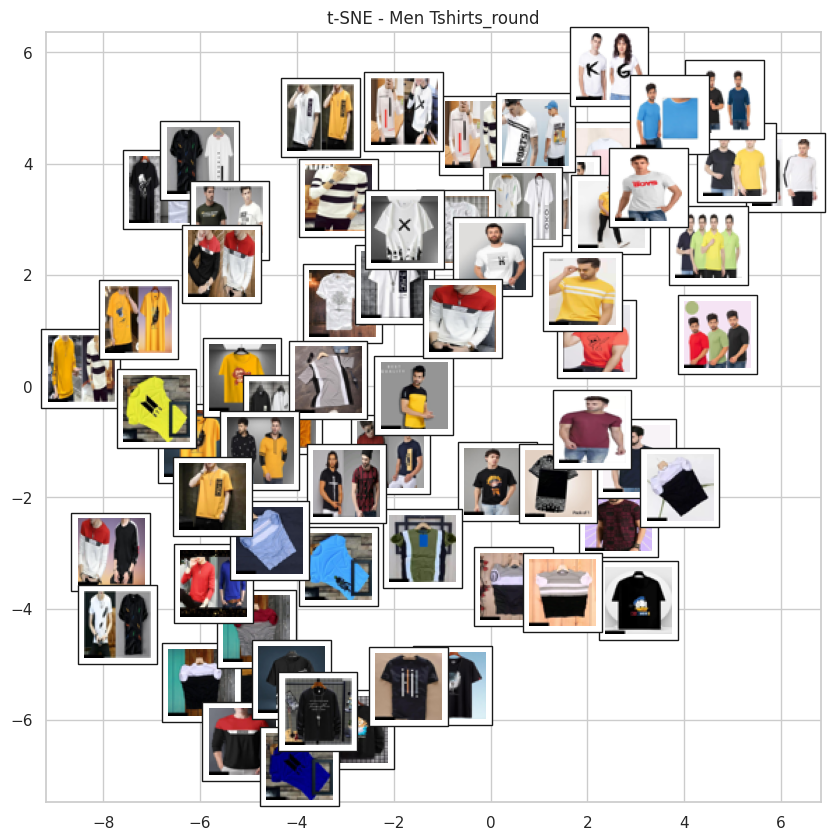

Processing Folder: Men Tshirts_long sleeves


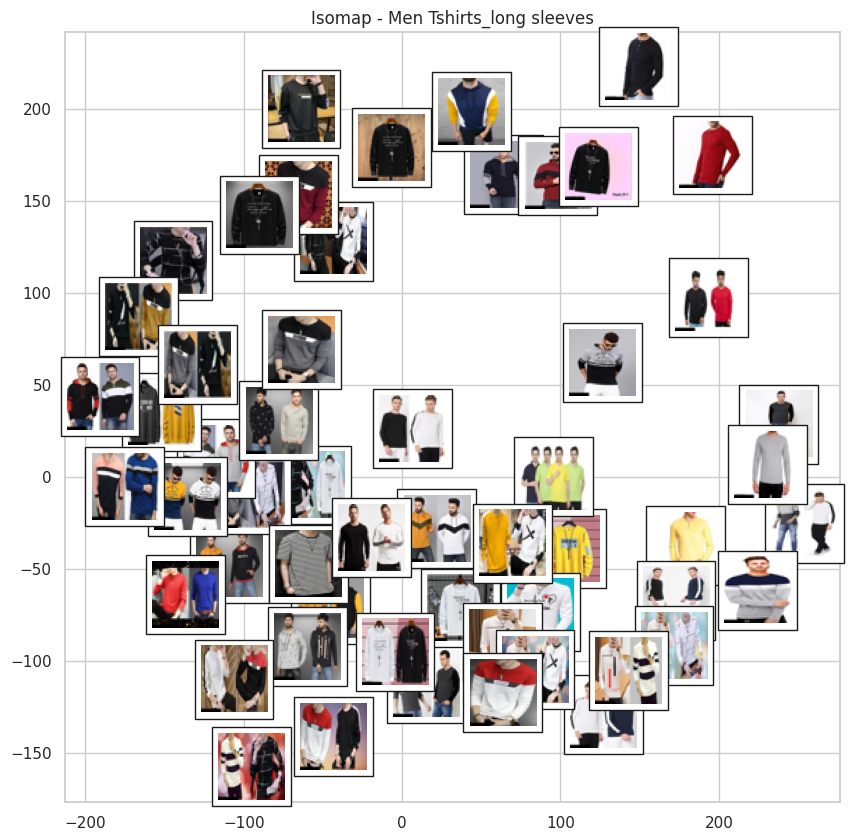

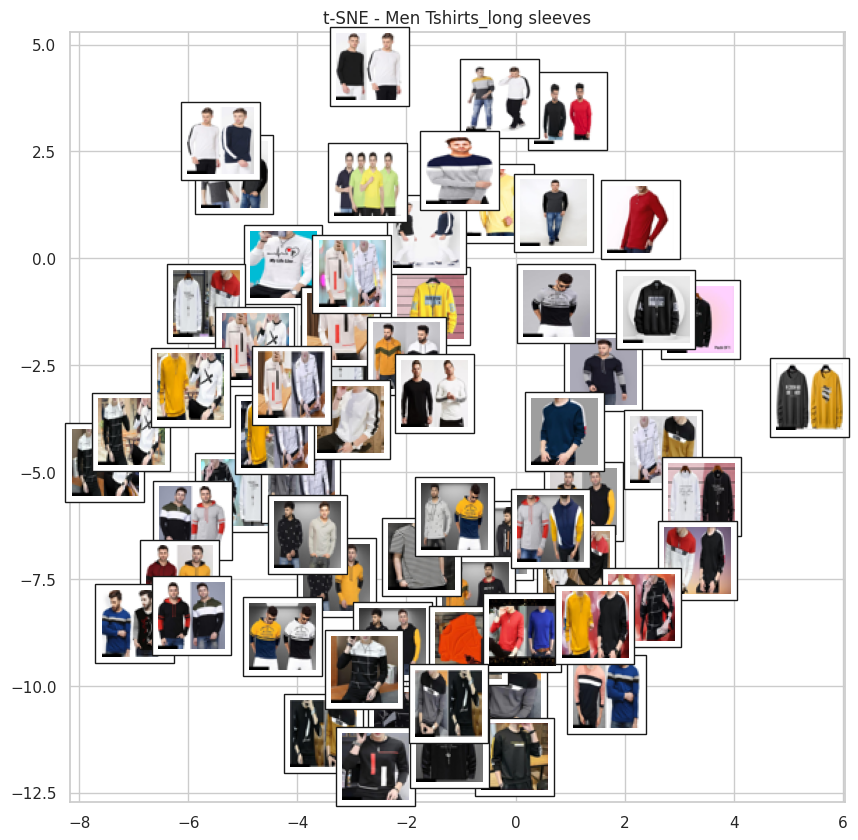

Processing Folder: Kurtis_sleeveless


/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:373: UserWarning: The number of connected components of the neighbors graph is 3 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])
/opt/conda/lib/python3.10/site-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])
/opt/conda/lib/python3.10/site-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])


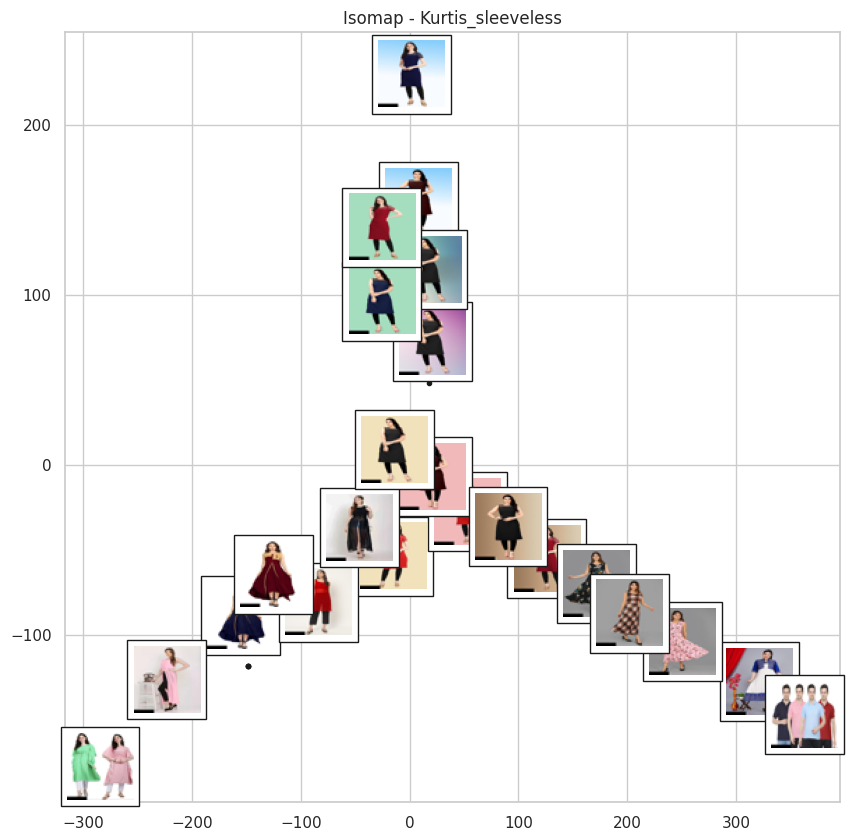

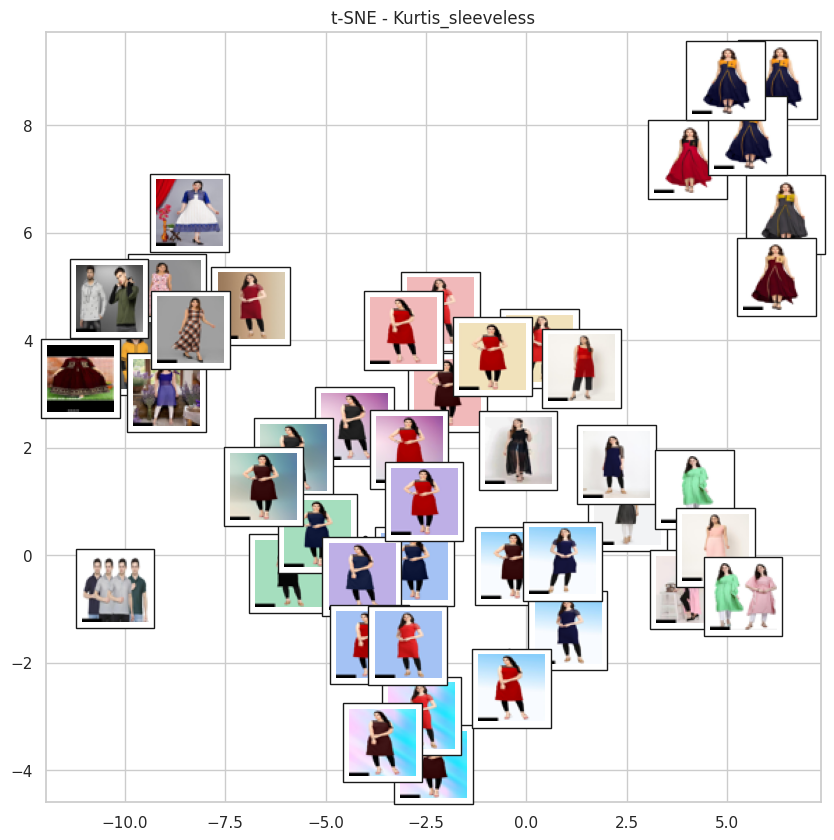

Processing Folder: Kurtis_multicolor


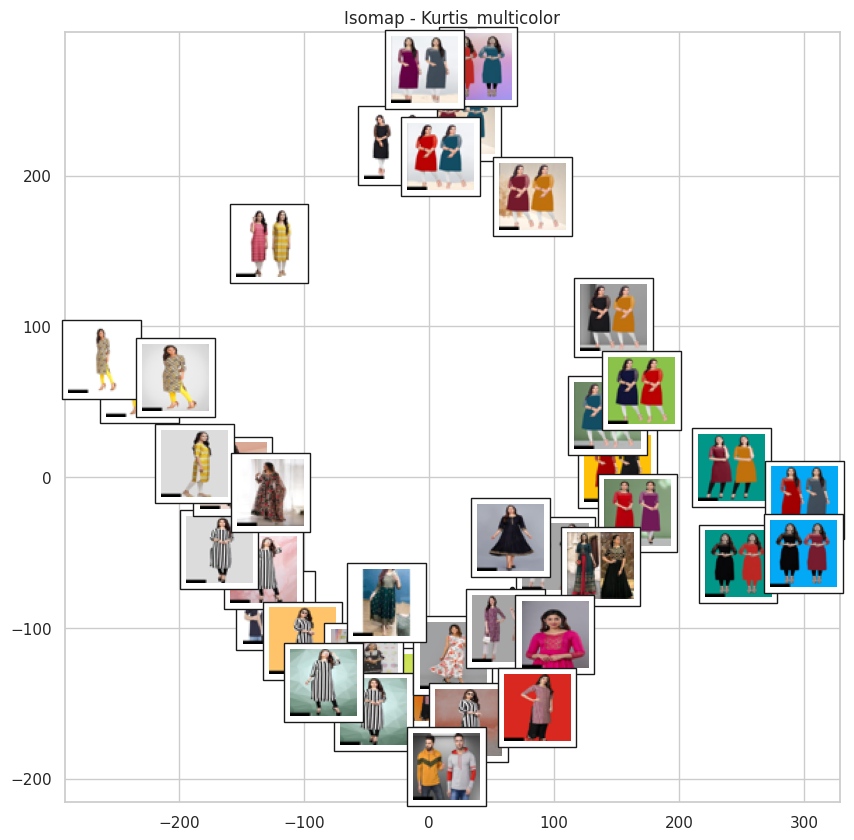

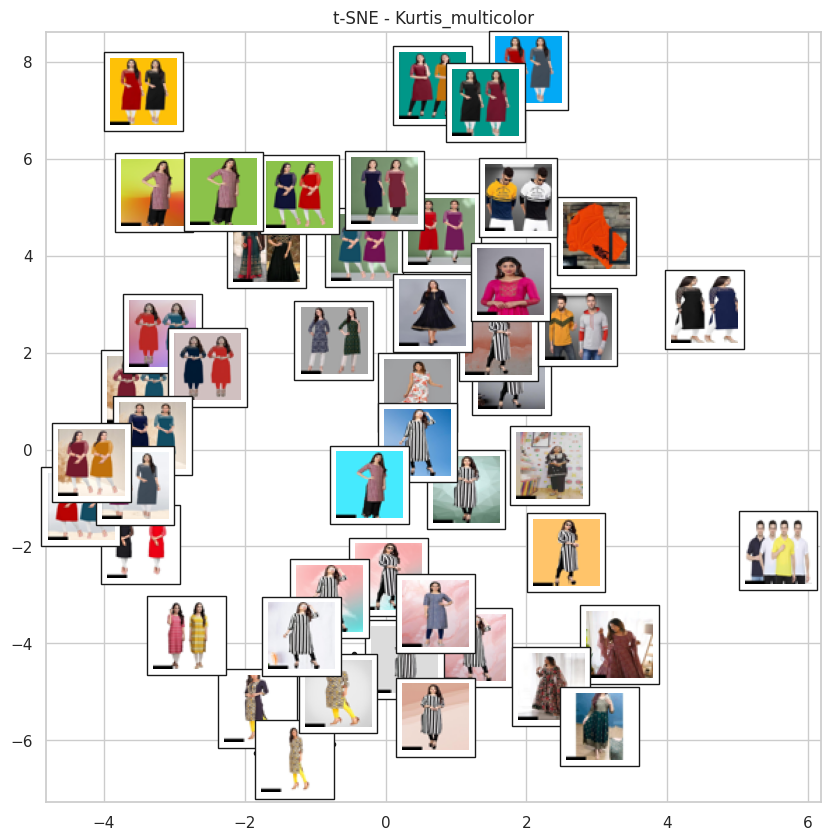

Processing Folder: Women Tshirts_regular


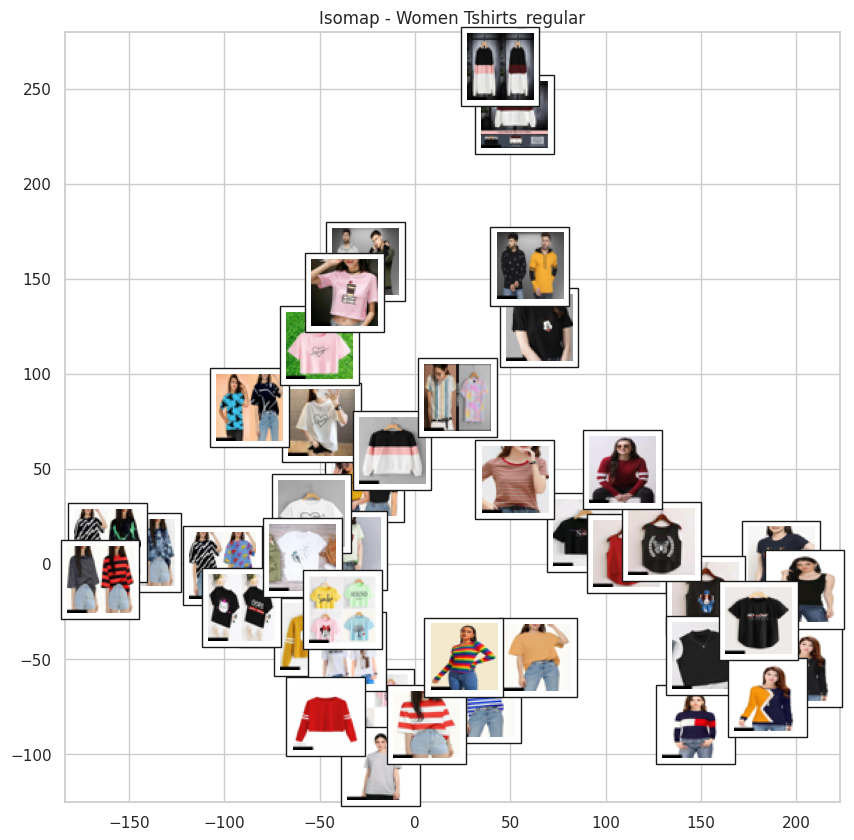

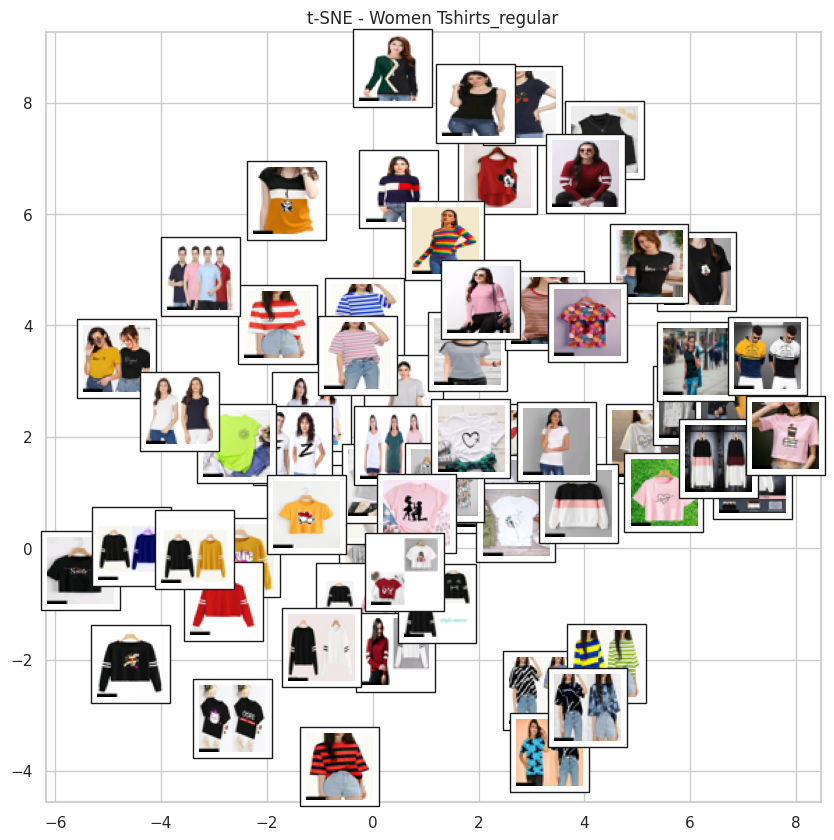

Processing Folder: Women Tops & Tunics_party


/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:373: UserWarning: The number of connected components of the neighbors graph is 2 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/opt/conda/lib/python3.10/site-packages/scipy/sparse/_index.py:108: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_intXint(row, col, x.flat[0])


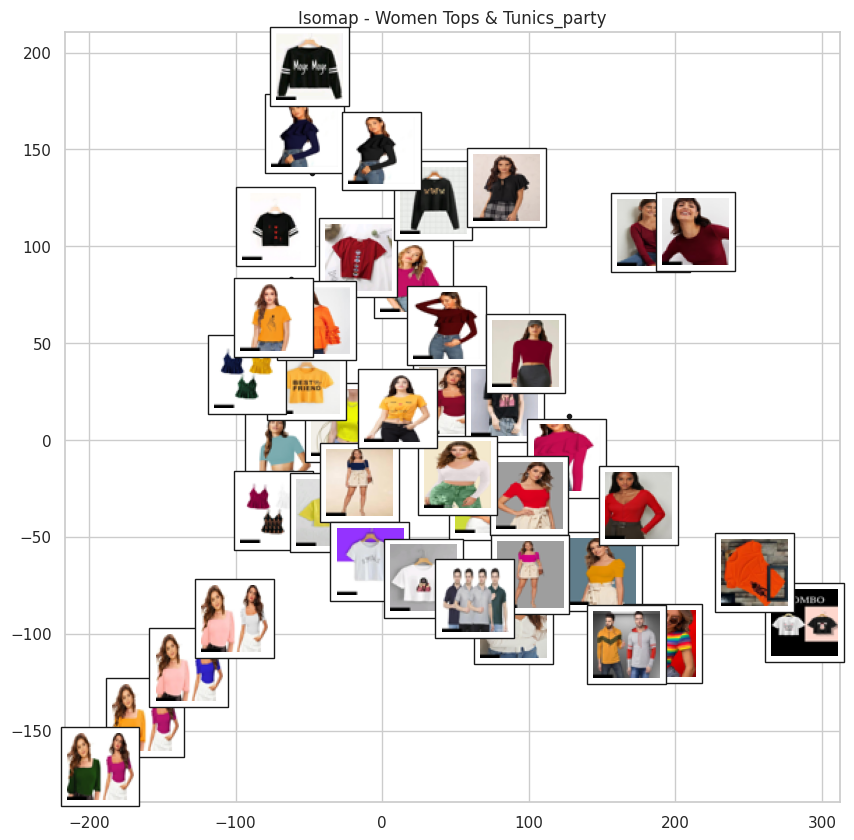

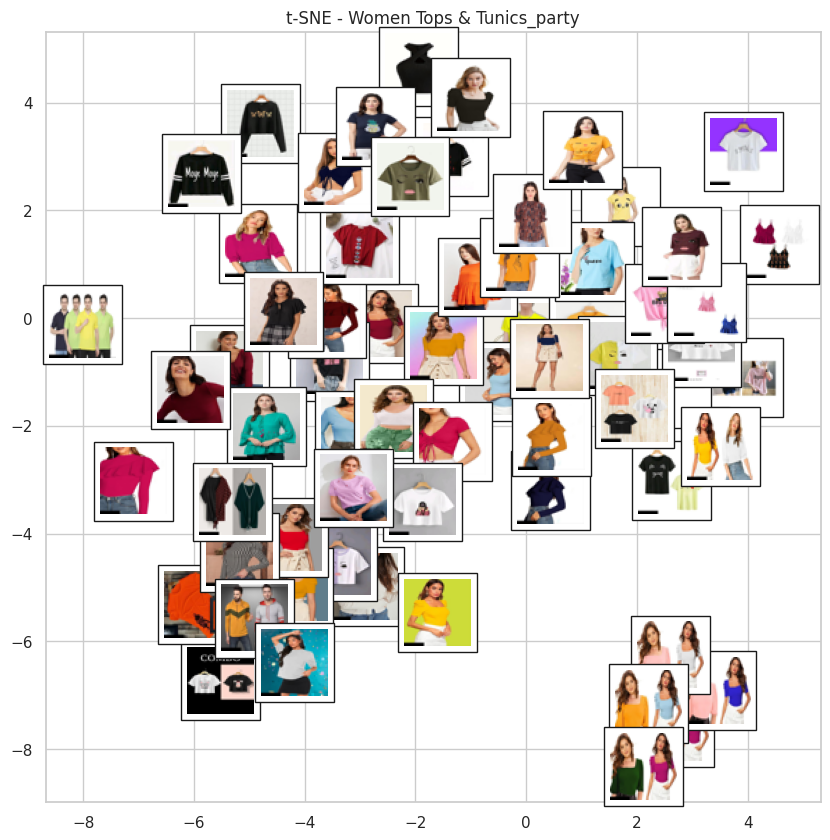

In [ ]:

import matplotlib.pyplot as plt
import random
from sklearn.manifold import Isomap, TSNE
from sklearn.preprocessing import StandardScaler
from matplotlib import offsetbox
from PIL import Image

# Function to load images as feature vectors
def load_images_as_vectors(image_dir, image_ids, target_size=(48, 48)):
    images = []
    for image_id in image_ids:
        img_path = os.path.join(image_dir, image_id)
        if os.path.exists(img_path):
            img = Image.open(img_path).convert('RGB')  # Load image
            img = img.resize(target_size)  # Resize image
            img_array = np.array(img)  # Convert to array
            images.append(img_array)  # Store the image array
    return np.array(images)

# Function to plot components with images
def plot_components(data, model, images=None, ax=None,
                    thumb_frac=0.05, cmap='gray'):
    ax = ax or plt.gca()
    proj = model.fit_transform(data)
    ax.plot(proj[:, 0], proj[:, 1], '.k')

    if images is not None:
        min_dist_2 = (thumb_frac * max(proj.max(0) - proj.min(0))) ** 2
        shown_images = np.array([2 * proj.max(0)])  # Initialize shown_images
        for i in range(data.shape[0]):
            dist = np.sum((proj[i] - shown_images) ** 2, 1)
            if np.min(dist) < min_dist_2:
                continue  # Skip too close points
            shown_images = np.vstack([shown_images, proj[i]])
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(images[i], cmap=cmap),
                proj[i])
            ax.add_artist(imagebox)

# Define the directory containing the baskets
baskets_dir = '/kaggle/working/baskets'

# List of folders (baskets)
folders = [
    "Women Tshirts_cuffed sleeves",
    "Women Tops & Tunics_party",
    "Sarees_traditional",
    "Sarees_wedding",
    "Men Tshirts_round",
    "Men Tshirts_long sleeves",
    "Kurtis_sleeveless",
    "Kurtis_multicolor",
    "Women Tshirts_regular",
    "Women Tops & Tunics_party"  # This appears to be a duplicate, verify if needed
]

# Loop through each folder and process images
for folder in folders:
    folder_path = os.path.join(baskets_dir, folder)
    print(f"Processing Folder: {folder}")

    # List all image files in the folder
    all_images = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png'))]

    # Randomly select 100 images
    selected_images = random.sample(all_images, 100)

    # Load images into a feature array
    images = load_images_as_vectors(folder_path, selected_images)

    # Check if images are loaded correctly
    if images.size == 0:
        print(f"No images found for folder {folder}. Skipping...")
        continue

    feature_vectors = np.array([img.flatten() for img in images])  # Flatten each image for feature representation

    # Standardize the feature vectors
    scaler = StandardScaler()
    feature_vectors = scaler.fit_transform(feature_vectors)

    # Isomap
    fig, ax = plt.subplots(figsize=(10, 10))
    plot_components(feature_vectors, model=Isomap(n_components=2), images=images)
    plt.title(f'Isomap - {folder}')
    plt.show()

    # t-SNE
    fig, ax = plt.subplots(figsize=(10, 10))
    plot_components(feature_vectors, model=TSNE(n_components=2, random_state=42), images=images)
    plt.title(f't-SNE - {folder}')
    plt.show()

#Task - 3
To recognise the patterns and find the names for the components of our manifold learning methods used.And reason our choice for the discovered manifold dimension

## Women Tops & Tunics Round Neck Isomap Plot

### Dimensions Explanation:
1. **Y-Axis (Vertical Distribution):**  
   - **Top:** Darker, more formal tops.  
   - **Bottom:** Lighter, more casual tops.

   **Inferred Component:** Formality / Color Brightness.

2. **X-Axis (Horizontal Distribution):**  
   - **Left:** Simple, solid-colored tops.  
   - **Right:** Complex, multi-colored patterns and unique designs.

   **Inferred Component:** Pattern Complexity / Design Style.

---

## Men T-Shirts (Short Sleeves) Isomap Plot

### Dimensions Explanation:
1. **Y-Axis (Vertical Distribution):**  
   - **Top:** T-shirts with complex designs or graphics.  
   - **Bottom:** T-shirts with simpler, plain designs.

   **Inferred Component:** Design Complexity.

2. **X-Axis (Horizontal Distribution):**  
   - **Left:** Darker or muted colors.  
   - **Right:** Brighter, more vibrant colors.

   **Inferred Component:** Color Intensity.

---

## Men T-Shirts (Printed) Isomap Plot

### Dimensions Explanation:
1. **Y-Axis (Vertical Distribution):**  
   - **Top:** Printed T-shirts with intricate, detailed designs.  
   - **Bottom:** Printed T-shirts with simpler, minimal designs.

   **Inferred Component:** Print Design Complexity.

2. **X-Axis (Horizontal Distribution):**  
   - **Left:** T-shirts with low color contrast or fewer colors.  
   - **Right:** T-shirts with high color contrast or multiple colors.

   **Inferred Component:** Color Contrast in Print.

---

## Sarees (Wedding) Isomap Plot

### Dimensions Explanation:
1. **Y-Axis (Vertical Distribution):**  
   - **Top:** Heavily embellished or ornate sarees.  
   - **Bottom:** Plain or minimally decorated sarees.

   **Inferred Component:** Embellishment Level.

2. **X-Axis (Horizontal Distribution):**  
   - **Left:** Sarees with muted or pastel colors.  
   - **Right:** Sarees with rich, vibrant colors.

   **Inferred Component:** Color Richness.

---

## Women Tops & Tunics Blue Isomap Plot

### Dimensions Explanation:
1. **Y-Axis (Vertical Distribution):**  
   - **Top:** Formal, structured tops like sweaters or cardigans.  
   - **Bottom:** Casual, sporty tops like tank tops or t-shirts.

   **Inferred Component:** Formality / Fit Structure.

2. **X-Axis (Horizontal Distribution):**  
   - **Left:** Plain, monochromatic tops with minimal styling.  
   - **Right:** Bold, multi-colored tops with prints and accessories.

   **Inferred Component:** Styling Complexity / Embellishment Level.

## Sarees (Party) Isomap Plot

### Dimensions Explanation:
1. **Y-Axis (Vertical Distribution):**  
   - **Top:** Sarees with complex designs or detailed embellishments.  
   - **Bottom:** Simpler or less embellished sarees.

   **Inferred Component:** Design Complexity.

2. **X-Axis (Horizontal Distribution):**  
   - **Left:** Sarees in lighter or muted colors.  
   - **Right:** Sarees in richer, more vibrant colors.

   **Inferred Component:** Color Intensity.

---

## Women T-Shirts (Pink) Isomap Plot

### Dimensions Explanation:
1. **Y-Axis (Vertical Distribution):**  
   - **Top:** T-shirts with vibrant or intense shades of pink.  
   - **Bottom:** T-shirts with lighter or pastel pink shades.

   **Inferred Component:** Color Shade Intensity.

2. **X-Axis (Horizontal Distribution):**  
   - **Left:** T-shirts with more intricate designs or patterns.  
   - **Right:** T-shirts with simpler or plain styles.

   **Inferred Component:** Design Complexity.

---

## Women T-Shirts (Printed) Isomap Plot

### Dimensions Explanation:
1. **Y-Axis (Vertical Distribution):**  
   - **Top:** T-shirts with colorful, cartoonish, or highly detailed prints.  
   - **Bottom:** T-shirts with simpler or minimalistic print designs.

   **Inferred Component:** Print Design Complexity.

2. **X-Axis (Horizontal Distribution):**  
   - **Left:** T-shirts with lighter, pastel colors or muted tones.  
   - **Right:** T-shirts with darker, more vibrant colors.

   **Inferred Component:** Color Vibrancy.

## Kutris Green Isomap Plot

### Dimensions Explanation:
1. **Y-Axis (Vertical Distribution):**  
   - **Top:** Heavier fabrics or embroidered kurtis with darker shades.  
   - **Bottom:** Lightweight fabrics, plain designs, and brighter greens.

   **Inferred Component:** Fabric Weight / Design Complexity.

2. **X-Axis (Horizontal Distribution):**  
   - **Left:** Traditional kurtis with intricate patterns or embroidery.  
   - **Right:** Contemporary kurtis with simple, modern designs.

   **Inferred Component:** Traditional vs. Modern Styling.

## Kurtis Party Isomap Plot

### Dimensions Explanation:
1. **Y-Axis (Vertical Distribution):**  
   - **Top:** Heavily embellished, festive kurtis.  
   - **Bottom:** Plain or minimally decorated kurtis.

   **Inferred Component:** Embellishment / Festiveness Level.

2. **X-Axis (Horizontal Distribution):**  
   - **Left:** Bright, vibrant colors used for celebrations.  
   - **Right:** Subtle, muted tones suitable for semi-formal occasions.

   **Inferred Component:** Color Vibrancy.